In [1]:
                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                            # make necessary imports
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torch.utils.data
from torch.optim import *
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
from pathlib import Path
import pandas as pd
import numpy as np

import sys
sys.path.append("../src")
from AEv3 import AEv3wrapper
from helpers import draw_3d_plotly, make_NoisySwissRoll, create_word2vec_sample
sys.path.pop()

'../src'

# Table of contents <a name="toc"></a>
<br>
<br>

1. [AutoEncoder vs Spectral embedding by sklearn - quality estimation](#qe)<br>
    1.1. [Sklearn Spectral embedding into 3 dimensions](#sklearn)<br>
    1.2. [AE embedding in 3 dimensions](#AE)<br>
    1.3. [Original data visualization](#original)<br><br>
2. [Performance assessment on noisy Swiss Roll dataset](#pa)<br>
    2.1. [Varying N while keeping D=100 constant](#constD)<br>
    2.2. [Varying D while keeping N = 50 000 constant](#constN)<br><br>
    
3. [Applying AE to the word2vec dataset](#w2v)

## AutoEncoder vs Spectral embedding by sklearn - quality estimation <a name="qe"></a>
[to TOC](#toc)

In [2]:
data, data_no_noise, colors = make_NoisySwissRoll(1000000, 12)

In [3]:
data.shape

(1000000, 15)

### Sklearn Spectral embedding into 3 dimensions <a name="sklearn"></a>
[to TOC](#toc)

In [9]:
from sklearn.manifold import SpectralEmbedding

embedding = SpectralEmbedding(n_components=3)
data_reduced = embedding.fit_transform(data)

In [10]:
draw_3d_plotly(data_reduced, colors)

### AE embedding into 3 dimensions <a name="AE"></a>
[to TOC](#toc)

In [4]:
OUTPUT_dim = 3
INPUT_dim = 15
EPOCH_NUM = 20
BATCH_SIZE = 500
OBSERVATIONS = 10**6

swiss_roll_dat = torch.Tensor(data)

# Split into training and testing sets 80-20
train_set, val_set = torch.utils.data.random_split(swiss_roll_dat,
                                                   [int(OBSERVATIONS*0.8), int(OBSERVATIONS*0.2)])

# prepare data loaders
trainloader = torch.utils.data.DataLoader(train_set, batch_size = BATCH_SIZE, shuffle=True)
testloader  = torch.utils.data.DataLoader(val_set, batch_size = BATCH_SIZE, shuffle=False)

ae = AEv3wrapper(INPUT_dim, 
                 OUTPUT_dim,
                 trainloader, 
                 testloader, 
                 hidden_activation="leaky_relu",
                 batch_norm = False)

for epoch in range(1, EPOCH_NUM + 1):
    ae.train_AE(epoch)
    keep_going = ae.test_AE(epoch)
    if not keep_going:
        print("Loss func stopped decreasing, stopping...")
        break

====> Epoch: 1 Average loss: 0.0291
====> Test set loss: 0.0291
====> Epoch: 2 Average loss: 0.0291
====> Test set loss: 0.0291
====> Epoch: 3 Average loss: 0.0291
====> Test set loss: 0.0291
====> Epoch: 4 Average loss: 0.0291
====> Test set loss: 0.0291
====> Epoch: 5 Average loss: 0.0291
====> Test set loss: 0.0291
====> Epoch: 6 Average loss: 0.0291
Loss func stopped decreasing, stopping...


In [5]:
data_reduced_ae = ae.model.encode(swiss_roll_dat[:30000]).detach().numpy()

In [7]:
draw_3d_plotly(data_reduced_ae, colors[:30000], save=True, filename="CNN1milSwissRoll.html")

### Original data visualization <a name="original"></a>
[to TOC](#toc)

In [7]:
draw_3d_plotly(data_no_noise, colors,  save=True, filename="SR10000.html")

# Performance assessment on noisy Swiss Roll dataset <a name="pa"></a>

[to TOC](#toc)

Here we will once again use noisy Swiss Roll data and benchmark the performance of our AutoEncoder network. <br>
Following the paper by McQueen and Co (megaman: manifold learning with millions of points), we will first try varying the number of observations in the dataset in $10^4$ to $10^6$ interval with constant number of noise dimensions D = 97. Second, we shall vary D from $10$ to $10^4$ while keeping N = 50 000 <br>

In case of AutoEncoder, the question "how much time did it take to train?" is not as straightforward as it is with neighbour-graph based methods. In previous section, we did 10 epochs, but we clearly see that the loss functions stopped decreasing way earlier. It, of course, does not necessarily mean that if we continued to loop we would never see any improvement. 
In order to define training time more clearly, we will use a crude option of early stopping: if test loss does not decrease over M periods, we stop. We are not concerned with selecting the best model (that is not the point right now). 
We use $time$ library to track training time in each case.

### Varying N while keeping D=100 constant <a name="constD"></a>
[to TOC](#toc)

In [10]:
import time
OUTPUT_dim = 3
INPUT_dim = 100
EPOCH_NUM = 50
BATCH_SIZE = 100

observations_nums = [10**4, 5*10**4, 10**5, 2*10**5, 5*10**5, 6*10**5, 10**6]
exec_times = list()

for OBSERVATIONS in observations_nums:
    data, data_no_noise, colors = make_NoisySwissRoll(OBSERVATIONS, 97)
    swiss_roll_dat = torch.Tensor(data)

    # Split into training and testing sets 80-20
    train_set, val_set = torch.utils.data.random_split(swiss_roll_dat,
                                                       [int(OBSERVATIONS*0.8), int(OBSERVATIONS*0.2)])

    # prepare data loaders
    trainloader = torch.utils.data.DataLoader(train_set, batch_size = BATCH_SIZE, shuffle=True)
    testloader  = torch.utils.data.DataLoader(val_set, batch_size = BATCH_SIZE, shuffle=False)

    ae = AEv2wrapper(INPUT_dim,
                     OUTPUT_dim,
                     trainloader, 
                     testloader,
                     hidden_activation="rrelu",
                     batch_norm=True,
                     early_stop_M=2)

    start_time = time.time()
    for epoch in range(1, EPOCH_NUM + 1):
        ae.train_AE(epoch)
        keep_going = ae.test_AE(epoch)
        if not keep_going:
            print("Loss func stopped decreasing, stopping...")
            break
    exec_sec = time.time() - start_time
    exec_times.append(exec_sec)

====> Epoch: 1 Average loss: 0.0063
====> Test set loss: 0.0009
====> Epoch: 2 Average loss: 0.0009
====> Test set loss: 0.0009
====> Epoch: 3 Average loss: 0.0009
====> Test set loss: 0.0009
====> Epoch: 4 Average loss: 0.0009
Loss func stopped decreasing, stopping...
====> Epoch: 1 Average loss: 0.0020
====> Test set loss: 0.0009
====> Epoch: 2 Average loss: 0.0009
====> Test set loss: 0.0008
====> Epoch: 3 Average loss: 0.0008
Loss func stopped decreasing, stopping...
====> Epoch: 1 Average loss: 0.0014
====> Test set loss: 0.0008
====> Epoch: 2 Average loss: 0.0008
====> Test set loss: 0.0008
====> Epoch: 3 Average loss: 0.0008
====> Test set loss: 0.0008
====> Epoch: 4 Average loss: 0.0008
Loss func stopped decreasing, stopping...
====> Epoch: 1 Average loss: 0.0012
====> Test set loss: 0.0008
====> Epoch: 2 Average loss: 0.0008
====> Test set loss: 0.0008
====> Epoch: 3 Average loss: 0.0008
====> Test set loss: 0.0008
====> Epoch: 4 Average loss: 0.0008
Loss func stopped decreasi

In [11]:
exec_times

[1.8622348308563232,
 5.649150133132935,
 14.33733057975769,
 30.396940231323242,
 82.35512065887451,
 111.78831577301025,
 144.83797454833984]

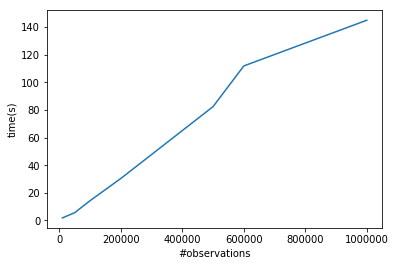

In [12]:
import seaborn as sns
plot_data = pd.DataFrame({"#observations": observations_nums, "time(s)": exec_times})
sns.lineplot(x = "#observations", y = "time(s)", data = plot_data)

In [13]:
data_reduced_ae = ae.model.encode(swiss_roll_dat).detach().numpy()
draw_3d_plotly(data_reduced_ae[:5000], colors[:5000],  save=True, filename="AEv2mil.html")

### Varying D while keeping N = 50 000 constant <a name="constN"></a>
[to TOC](#toc)

In [11]:
import time
OUTPUT_dim = 3
EPOCH_NUM = 50
BATCH_SIZE = 500
OBSERVATIONS = 50000

dimensions_nums = [10, 100, 500, 1000, 2000, 3000, 4000]
exec_times = list()

for DIMENSIONS in dimensions_nums:
    data, data_no_noise, colors = make_NoisySwissRoll(OBSERVATIONS, DIMENSIONS-3)
    swiss_roll_dat = torch.Tensor(data)

    # Split into training and testing sets 80-20
    train_set, val_set = torch.utils.data.random_split(swiss_roll_dat,
                                                       [int(OBSERVATIONS*0.8), int(OBSERVATIONS*0.2)])

    # prepare data loaders
    trainloader = torch.utils.data.DataLoader(train_set, batch_size = BATCH_SIZE, shuffle=True)
    testloader  = torch.utils.data.DataLoader(val_set, batch_size = BATCH_SIZE, shuffle=False)

    ae = AEv3wrapper(DIMENSIONS,
                     OUTPUT_dim, 
                     trainloader, 
                     testloader,
                     hidden_activation="rrelu",
                     batch_norm=True,
                     early_stop_M=2)

    start_time = time.time()
    for epoch in range(1, EPOCH_NUM + 1):
        ae.train_AE(epoch)
        keep_going = ae.test_AE(epoch)
        if not keep_going:
            print("Loss func stopped decreasing, stopping...")
            break
    exec_sec = time.time() - start_time
    exec_times.append(exec_sec)

====> Epoch: 1 Average loss: 0.0183
====> Test set loss: 0.0031
====> Epoch: 2 Average loss: 0.0011
====> Test set loss: 0.0003
====> Epoch: 3 Average loss: 0.0003
====> Test set loss: 0.0002
====> Epoch: 4 Average loss: 0.0003
Loss func stopped decreasing, stopping...
====> Epoch: 1 Average loss: 0.0019
====> Test set loss: 0.0004
====> Epoch: 2 Average loss: 0.0003
====> Test set loss: 0.0002
====> Epoch: 3 Average loss: 0.0002
====> Test set loss: 0.0002
====> Epoch: 4 Average loss: 0.0002
Loss func stopped decreasing, stopping...
====> Epoch: 1 Average loss: 0.0006
====> Test set loss: 0.0003
====> Epoch: 2 Average loss: 0.0002
====> Test set loss: 0.0002
====> Epoch: 3 Average loss: 0.0002
====> Test set loss: 0.0002
====> Epoch: 4 Average loss: 0.0002
Loss func stopped decreasing, stopping...
====> Epoch: 1 Average loss: 0.0004
====> Test set loss: 0.0002
====> Epoch: 2 Average loss: 0.0002
====> Test set loss: 0.0002
====> Epoch: 3 Average loss: 0.0002
====> Test set loss: 0.000

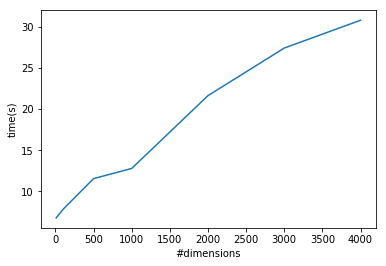

In [12]:
import seaborn as sns
plot_data = pd.DataFrame({"#dimensions": dimensions_nums, "time(s)": exec_times})
sns.lineplot(x = "#dimensions", y = "time(s)", data = plot_data)

In [13]:
swiss_roll_dat.shape

torch.Size([50000, 4000])

In [14]:
data_reduced_ae = ae.model.encode(swiss_roll_dat).detach().numpy()
draw_3d_plotly(data_reduced_ae[:5000], colors[:5000])

# Applying AE to the word2vec dataset <a name="w2v"></a>
[to TOC](#toc)

In [3]:
##################################################
##################################################
######### Preparing data for PyTorch #############
##################################################
##################################################

DATADIR = "../samples_word2vec"
FILE = "halfmil.csv"
PATH_TO_DATA = Path(DATADIR)/FILE
BATCH_SIZE = 500

# read the data in, convert it into PyTorch tensor
word2vec_dat_or = pd.read_csv(PATH_TO_DATA)[[str(i) for i in range(1,301)]]
word2vec_dat = torch.Tensor(word2vec_dat_or.to_numpy())
OBSERVATIONS = word2vec_dat.shape[0]
# Split into training and testing sets 80-20
train_set, val_set = torch.utils.data.random_split(word2vec_dat,
                                                   [int(OBSERVATIONS*0.8), int(OBSERVATIONS*0.2)])

# prepare data loaders
trainloader = torch.utils.data.DataLoader(train_set, batch_size = BATCH_SIZE, shuffle=True)
testloader  = torch.utils.data.DataLoader(val_set, batch_size = BATCH_SIZE, shuffle=False)

In [4]:
##################################################
##################################################
#########        Training VAE        #############
##################################################
##################################################

OUTPUT_dim = 2
INPUT_dim = 300
EPOCH_NUM = 20

ae = AEv3wrapper(INPUT_dim,
                 OUTPUT_dim,
                 trainloader,
                 testloader, 
                 hidden_activation="elu", 
                 batch_norm=True,
                 early_stop_M=2)

for epoch in range(1, EPOCH_NUM + 1):
    ae.train_AE(epoch)
    keep_going = ae.test_AE(epoch)
    if not keep_going:
        print("Loss func stopped decreasing, stopping...")
        break

====> Epoch: 1 Average loss: 0.0001
====> Test set loss: 0.0001
====> Epoch: 2 Average loss: 0.0001
====> Test set loss: 0.0001
====> Epoch: 3 Average loss: 0.0001
====> Test set loss: 0.0001
====> Epoch: 4 Average loss: 0.0001
Loss func stopped decreasing, stopping...


In [6]:
toplot = ae.model.encode(word2vec_dat).detach().numpy()

import seaborn as sns

sns_plot = sns.scatterplot(toplot[:,0], toplot[:,1])
sns_plot.get_figure().savefig("CNNw2vBig.png")

RuntimeError: [enforce fail at CPUAllocator.cpp:64] . DefaultCPUAllocator: can't allocate memory: you tried to allocate 3552000000 bytes. Error code 12 (Cannot allocate memory)
